**CV2023 - Week 3**

For questions use the email 
home.florinvasluianu@outlook.com.

EXERCISES 

**1bp** 1. Run the 5x5 eigenfilter in the ascending order on the bender image after applying a gaussian smoothing filter. What is the effect of the gaussian filter? Can you relate it to the PCA algorithm?

**2bp** 2. Compare the results of the eigenfilter when using the ascending vs. descending order. What can you observe? Why? Increase the size of the patch used to compute the eigen decomposition. Explain your results. 

**2bp** 3. Given the matrix A of size nxn, is there a relationship between the eigenvalues of the matrix A and the eigenvalues of the covariance matrix used for eigen decomposition? What is the definition of the covariance matrix? What is the relationship between the eigenvectors of the matrix A and the eigenvectors of the covariance matrix?

**3bp** 4. Using the information [here](https://www.cs.cmu.edu/~16385/s17/Slides/6.2_Harris_Corner_Detector.pdf), compare the Harris corner detector with the Kanade Tomasi operator and the Nobel operator. Start form the provided code to implement all the variants. 


In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt


plt.rcParams["figure.figsize"] = (30, 10)

**1. Gabor Filters**

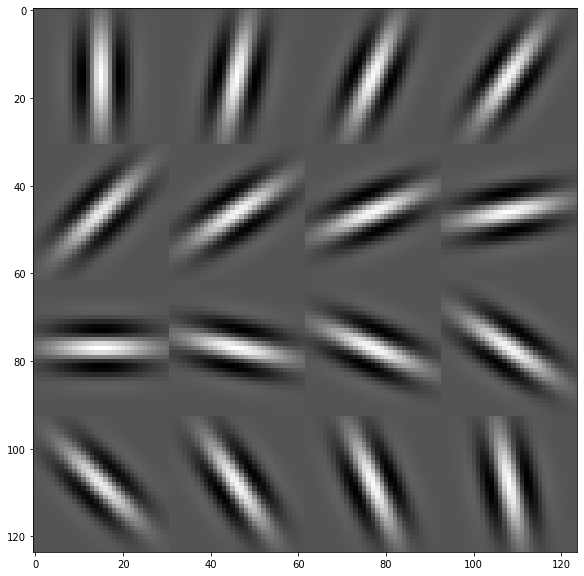

In [ ]:
img_monkey = cv.imread("/content/drive/MyDrive/teaching_IS_2023/resources/monkey.png")

kernel_size = 31
thetas = [i * np.pi / 16 for i in range(16)]
filters = []

# Gabor filters are some filters designed such that they are very responsive to 
# structure aligned with a direction represented by a fixed angle

for theta in thetas:
  kernel = cv.getGaborKernel(ksize=(kernel_size, kernel_size), sigma=4, 
                             theta=theta, lambd=10, gamma=0.5, 
                             psi=0, ktype=cv.CV_32F)
  kernel = kernel / (1.5 * kernel.sum())
  filters.append(kernel)


# a dummy piece of code that stores the gabor filter weights in a 4x4 gallery
filter_matrix = np.zeros((4 * kernel_size, 4 * kernel_size))
for i in range(4):
  for j in range(4):
    li = (i * kernel_size)
    ri = (i + 1) * kernel_size
    lj = (j * kernel_size)
    rj = (j + 1) * kernel_size
    filter_matrix[li: ri, lj: rj] = filters[4 * i + j]

plt.imshow(filter_matrix, cmap='gray')



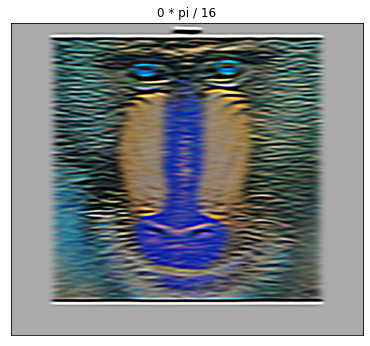

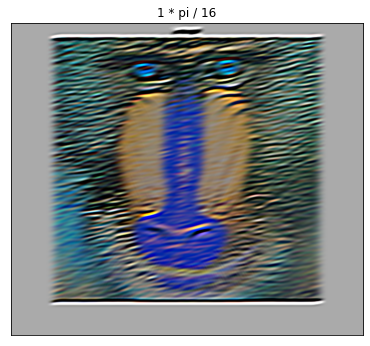

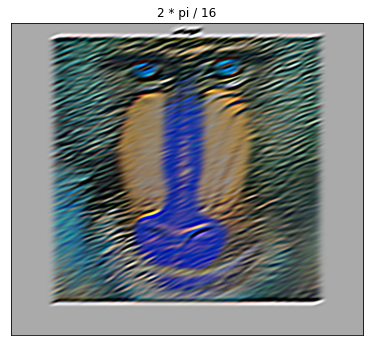

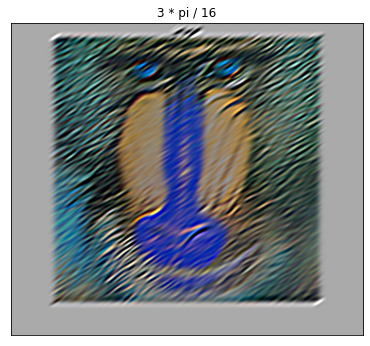

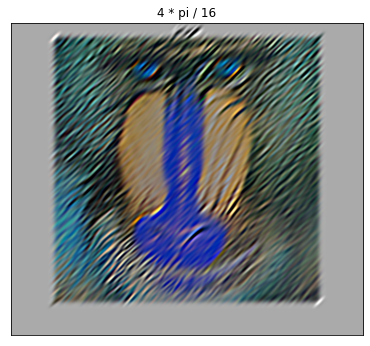

...

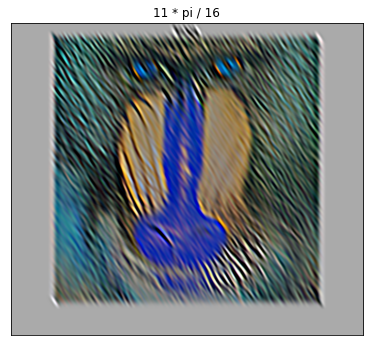

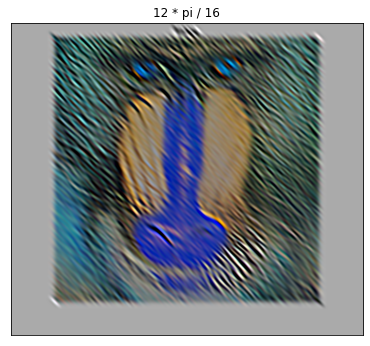

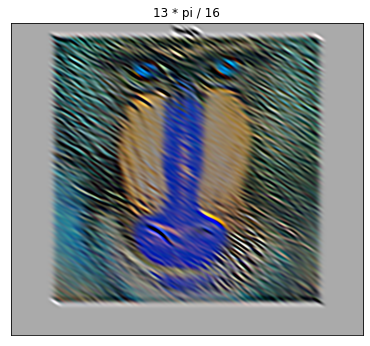

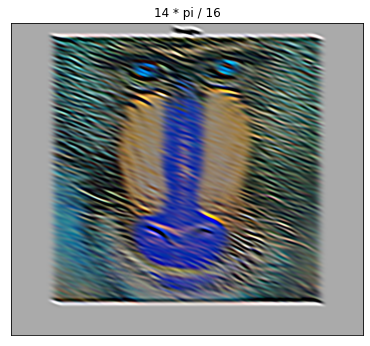

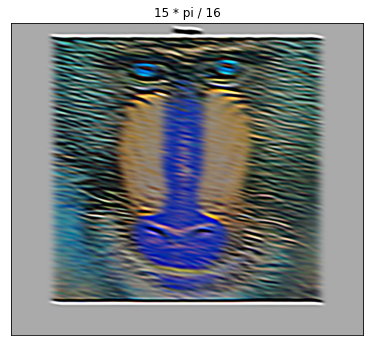

In [ ]:
# Here, It can be observed that applying the filter transposed, a certain relationship
# between the orientation of the emphasised structure and the angle set for the gabor filter

# Without transposing the filter, the structure emphasized would be perpendicular to 
# the angle set for the filter direction

result = np.zeros(img_monkey.shape)
n = len(filters)
for i, filter in enumerate(filters):
  plt.figure(figsize=(120, 70))
  filtered_img = cv.filter2D(img_monkey, -1,  filter.T)
  result = np.maximum(result, filtered_img)
  plt.subplot(1, n, i + 1)
  plt.xticks([])
  plt.yticks([])
  plt.title("{} * pi / 16".format(i))
  plt.imshow(filtered_img)
  plt.show()

  

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


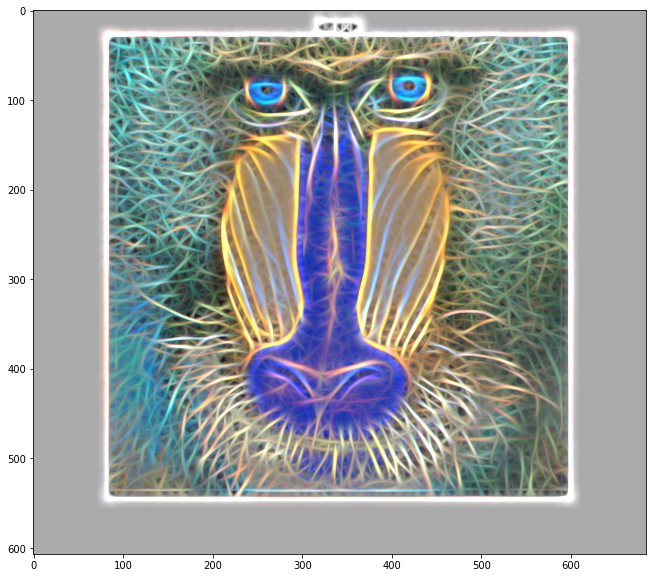

In [ ]:
result = result + result.min() / result.max()
plt.imshow(result.astype(int))
plt.show()

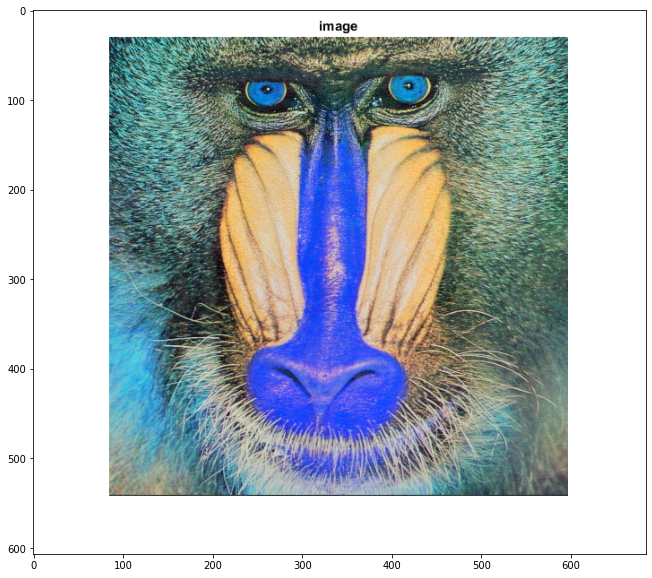

In [ ]:
plt.imshow(img_monkey)
plt.show()

**2. Eigenfilter**

In [ ]:
img_bender = cv.imread("/content/drive/MyDrive/teaching_IS_2023/resources/bender.png")
img_bender_gray = cv.cvtColor(img_bender, cv.COLOR_BGR2GRAY)

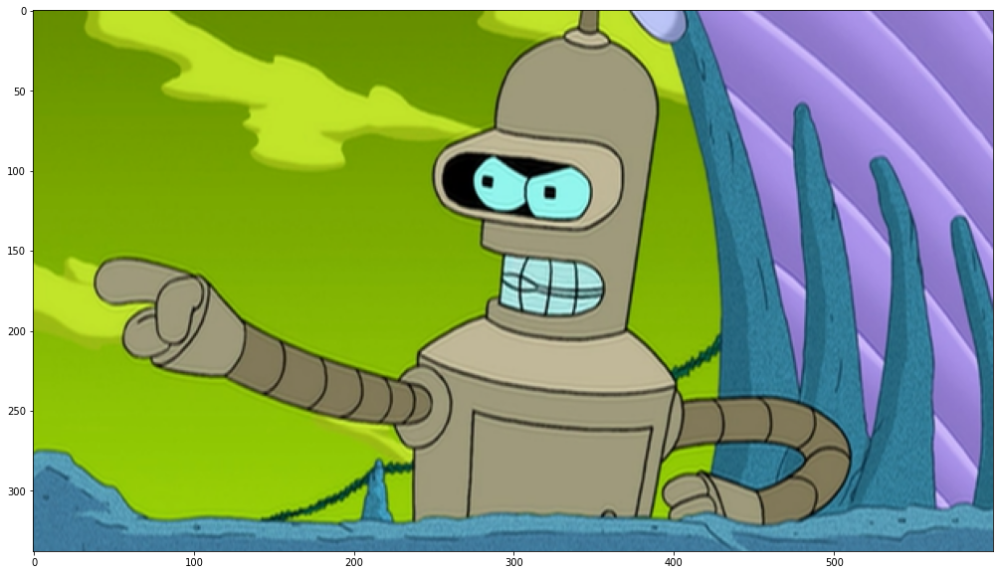

In [ ]:
plt.imshow(img_bender)
plt.show()

In [ ]:
from numpy.linalg import eig 
# A  = P * D * P^-1
# det(A - lambda In) = 0 
# A * x = lambda * x
# A*A^t

# v vector eigenvector for matrix A when exista lambda a scaalar, s t A @ v = lambda * v
# This function applies PCA over a local patch scaled to [0, 1], and returns the 
# smallest 3 eigenvalues as a filter response. Since the higher order principal 
# components encode lower frequency information, the smallest eigenvalues will capture
# the highest amount of detail (incl. noise)
def top_eigenvalues(local_patch, direction="asc"):
  normalized_lp = (local_patch  - local_patch.min())/(local_patch.max() - local_patch.min())
  covar_matrix = np.cov(normalized_lp)
  eigen_vals, eigen_vect = eig(np.nan_to_num(covar_matrix))
  
  sorted_eigenvals = np.sort(np.abs(eigen_vals))

  if direction == "asc":
    return sorted_eigenvals[:3]
  else:
    return sorted_eigenvals[::-1][:3]


# filtering is done in the same fashion as in the conv2D, as the convolution is 
# at the heart of the Image Processing domain. 
def eigen_filter(input_image, patch_size, agg_function, direction='asc'):
  h, w = input_image.shape
  h_c, w_c = patch_size

  d_h = h_c // 2
  d_w = w_c // 2

  # apply zero-padding for the input image
  oper_image = np.zeros((h + 2 * d_h, w + 2 * d_w))
  oper_image[d_h:(h + d_h), d_w:(w + d_w)] = input_image
  output_img = np.zeros((h, w, 3))

  for i in range(h):
    for j in range(w):
      l_i = i + d_h
      l_j = j + d_w
      patch = oper_image[(l_i - d_h):(l_i + d_h + 1), (l_j - d_w):(l_j + d_w + 1)]
      output_img[i, j, :] = agg_function(patch, direction=direction)

  output_img = (output_img  - output_img.min())/(output_img.max() - output_img.min())
  return output_img

<ipython-input-49-16b0eeb792c5>:9: RuntimeWarning: invalid value encountered in true_divide
  normalized_lp = (local_patch  - local_patch.min())/(local_patch.max() - local_patch.min())


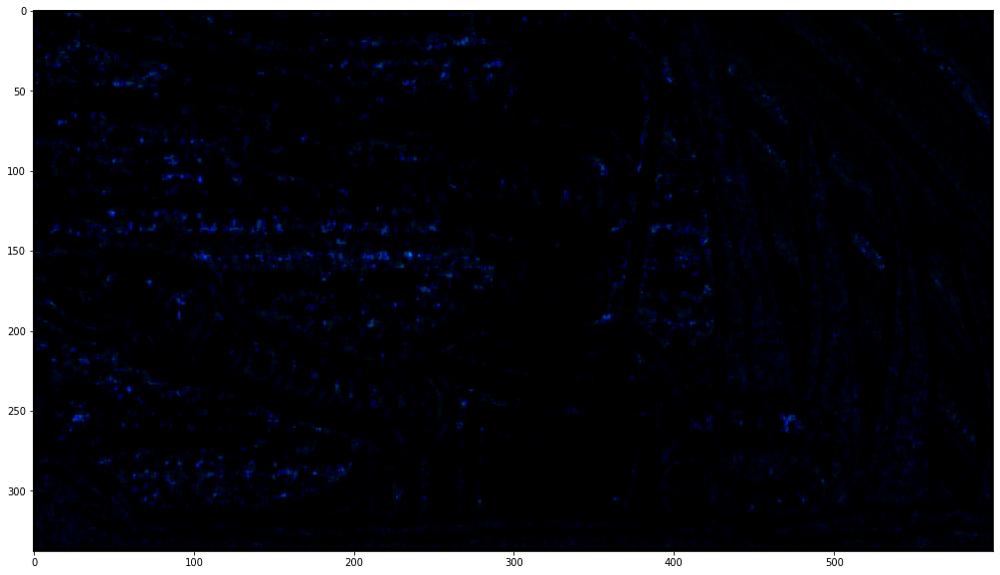

In [ ]:
plt.imshow(eigen_filter(img_bender_gray, (5, 5), top_eigenvalues, direction="asc"))

<ipython-input-49-16b0eeb792c5>:9: RuntimeWarning: invalid value encountered in true_divide
  normalized_lp = (local_patch  - local_patch.min())/(local_patch.max() - local_patch.min())


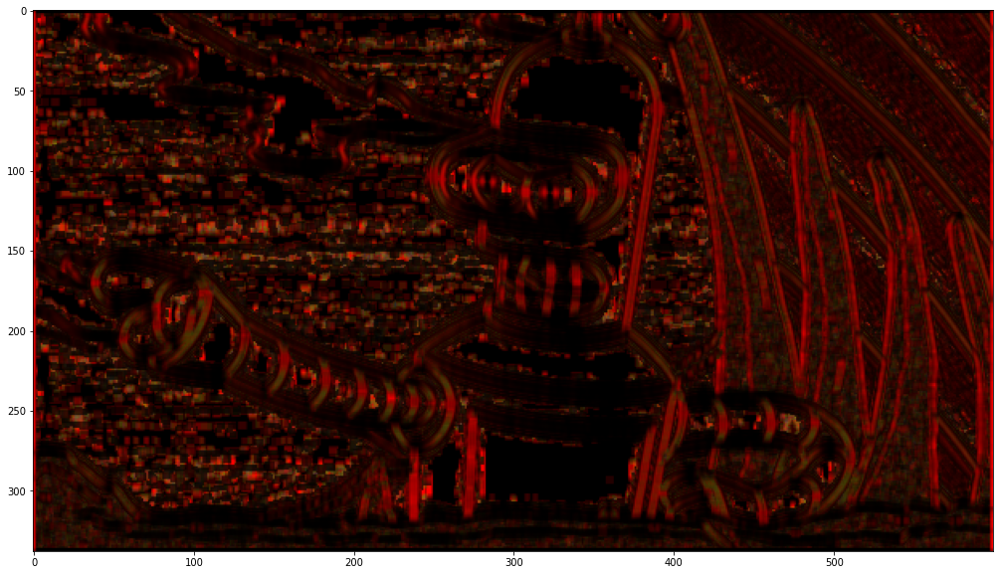

In [ ]:
plt.imshow(eigen_filter(img_bender_gray, (5, 5), top_eigenvalues, direction="desc"))

**3. Harris Corner Detector**


In this exercise, we will implment a Harris corner detector for feature extraction. Additional feature extraction and metching methods will be featured in the next sections.

The Harris corner detector starts with the image gradients, that will be computed using the next correlation masks:

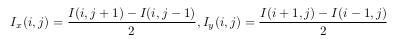

Next, the local auto-correlation matrix is going to be defined, for each pixel *p*, where *N(p)* is the neighborhood of the pixel *p*. The weights are  defined using the normal distribution cenetered in *p*, with *sigma* variance. Values for these hyperparameters are going to be provided in the implementation.

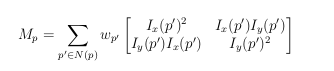

Then, the Harris response ig going to be computed using the next equation:


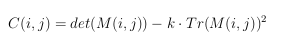

Finally, an additional step of non-maximum values suppression is going to be added, to get the filter response around the corners, and their position. For a pixel to be corresponding to a corner, it has to be a local patch maximum harris response and it the response has to be above a given threshold. 
Recommended parameters are provided with the implementation.


In [ ]:
from skimage.feature import peak_local_max
from scipy.ndimage.filters import maximum_filter


def extract_harris_response(in_img, sigma, k, thresh, min_distance):
  h, w = in_img.shape
  width = int(np.ceil(3 * sigma)) # 97% of the values are in [m-3s, m+3s]
  # compute a gaussian kernel based on the sigma value
  xx = np.vstack([np.arange(-width, width + 1, dtype=np.float32) for _ in range(2 * width + 1)])
  yy = xx.T
  gaussian_kern = 1/(2 * sigma**2) * (-(np.square(xx) + np.square(yy)))
  gaussian_kern = np.exp(gaussian_kern)
  
  # compute image gradients
  horizontal_filter = 1/2 * np.array([[0, 0, 0],
                                      [-1, 0, 1],
                                      [0, 0, 0]])
  vertical_filter = 1/2 * np.array([[0, -1, 0],
                                    [0, 0, 0],
                                    [0, 1, 0]])
  in_img_x = cv.filter2D(in_img, -1, horizontal_filter)
  in_img_y = cv.filter2D(in_img, -1, vertical_filter)

  # compute the square and the elementwise multiplication of the gradients 
  # simulate the gaussian neighborhood in the definition through a convolution of the 
  # gradients values with the gaussian filter
  img_x_sq = cv.filter2D(np.square(in_img_x), -1, gaussian_kern)
  img_y_sq = cv.filter2D(np.square(in_img_y), -1, gaussian_kern)
  img_xy = cv.filter2D(in_img_x * in_img_y, -1, gaussian_kern)

  # allocate memory for the filter output
  C = np.zeros((h, w))
  # keep indices for the corners
  corners = np.zeros((2, h * w))

  # compute the filter response for each of the image pixels
  for i in range(h):
    for j in range(w):
      H = np.array([[img_x_sq[i, j], img_xy[i, j]], 
                    [img_xy[i, j], img_y_sq[i, j]]])
      filter_response = np.linalg.det(H) - k * (np.trace(H) ** 2)
      C[i, j] = filter_response

  # perform non_max suppression (suppress all the values that are non-maximum in
  # a local neighborhood)
  coordinates = peak_local_max(C, min_distance=min_distance)


  corner_idx = 0
  for i, j in coordinates:
    if C[i, j] > thresh * C.max():
        corners[:, corner_idx] = np.array([i, j])
        corner_idx += 1
  
  return C, corners[:, :corner_idx]



<ipython-input-56-3e5967e43b12>:2: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import maximum_filter


In [ ]:
# recommended params for sigma [.5, 1, 2]
# k [4e-2, 6e-2]
# thresh [1e-6, 1e-4]
img_house = cv.imread('/content/drive/MyDrive/teaching_IS_2023/resources/image001.jpg')
in_img = cv.cvtColor(img_house, cv.COLOR_BGR2GRAY).astype(np.float32)
C, corner_idx = extract_harris_response(in_img, 1, 4e-2, 1e-4, min_distance=45)


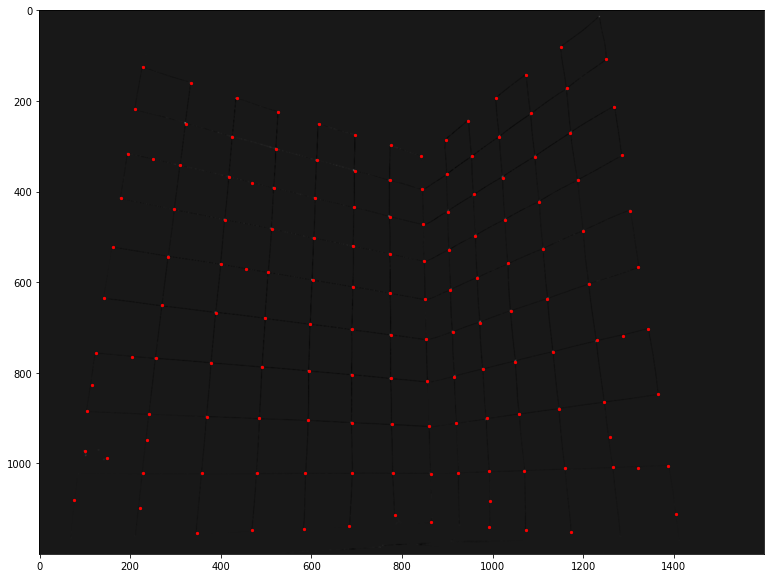

In [ ]:
plt.imshow(C, cmap='gray')
for position in corner_idx.T:
  plt.scatter(position[1], position[0], s=5, c='red', marker='o')

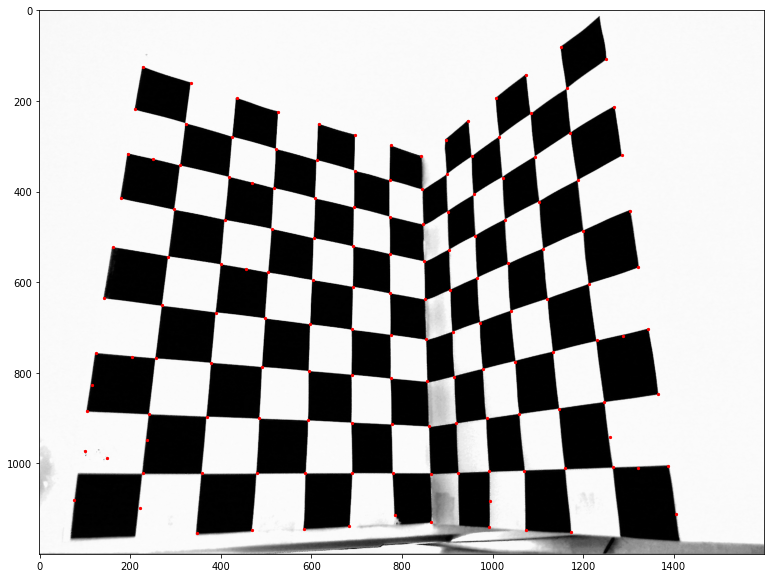

In [ ]:
plt.imshow(in_img, cmap='gray')
for position in corner_idx.T:
  plt.scatter(position[1], position[0], s=5, c='red', marker='o')

In [ ]:
img_l1 = cv.imread('/content/drive/MyDrive/teaching_IS_2023/resources/I1.jpg')
img_l2 = cv.imread('/content/drive/MyDrive/teaching_IS_2023/resources/I2.jpg')

h, w, _ = img_l1.shape
print(h, w)

l1_gray = cv.cvtColor(img_l1, cv.COLOR_BGR2GRAY).astype(np.float32)
l2_gray = cv.cvtColor(img_l2, cv.COLOR_BGR2GRAY).astype(np.float32)

# extract the harris corners from the image pair
C_l1, l1_corner_idx = extract_harris_response(l1_gray, 1, 4e-2, 1e-4, min_distance=30)
C_l2, l2_corner_idx = extract_harris_response(l2_gray, 1, 4e-2, 1e-4, min_distance=30)

490 653


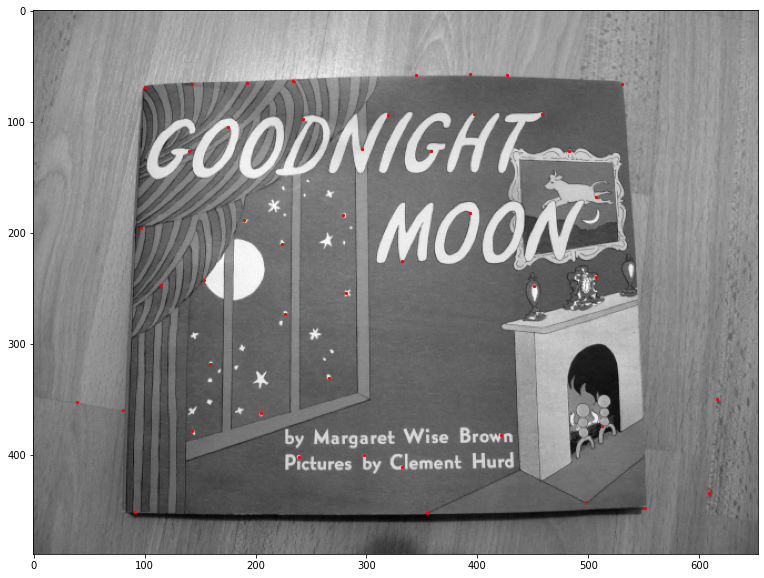

In [ ]:
plt.imshow(l1_gray, cmap='gray')
for position in l1_corner_idx.T:
  plt.scatter(position[1], position[0], s=5, c='red', marker='o')

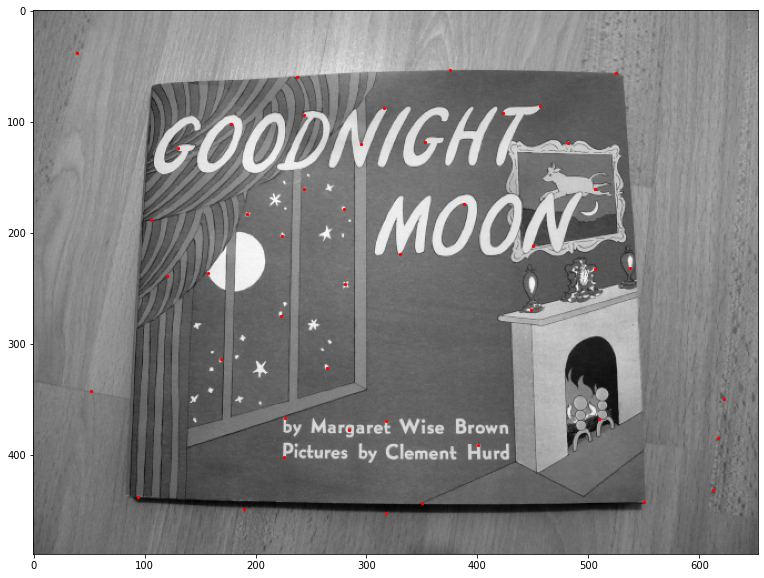

In [ ]:
plt.imshow(l2_gray, cmap='gray')
for position in l2_corner_idx.T:
  plt.scatter(position[1], position[0], s=5, c='red', marker='o')

In [ ]:
# we will use a 9x9 patch based descriptor, so we have to filter candidated in 
# the 4 pixels outer border

def filter_candidate_points(candidate, width, height):
  y, x = candidate # keep in mind the switch between indices and axes
  if x >= 4 and x < width - 4 and y >=4 and y < height - 4:
    return True
  else:
    return False

In [ ]:
# the filter descriptor is a flattened version of the patch around 
# the detected input point
def feature_extractor(img, point):
  i, j = point.astype(np.int32)
  return img[(i-4):(i+5), (j-4):(j+5)].flatten()

**Extracting the feature descriptors**

In [ ]:
# filter the candidate  points on the border
filtered_l1_candidates = np.array([x for x in l1_corner_idx.T if filter_candidate_points(x, w, h)]).T
filtered_l2_candidates = np.array([x for x in l2_corner_idx.T if filter_candidate_points(x, w, h)]).T

In [ ]:
l1_data = np.array([feature_extractor(l1_gray, x) for x in filtered_l1_candidates.T])
l2_data = np.array([feature_extractor(l2_gray, x) for x in filtered_l2_candidates.T])
print(l1_data.shape, l2_data.shape) 

(47, 81) (46, 81)


**Plot the matches**

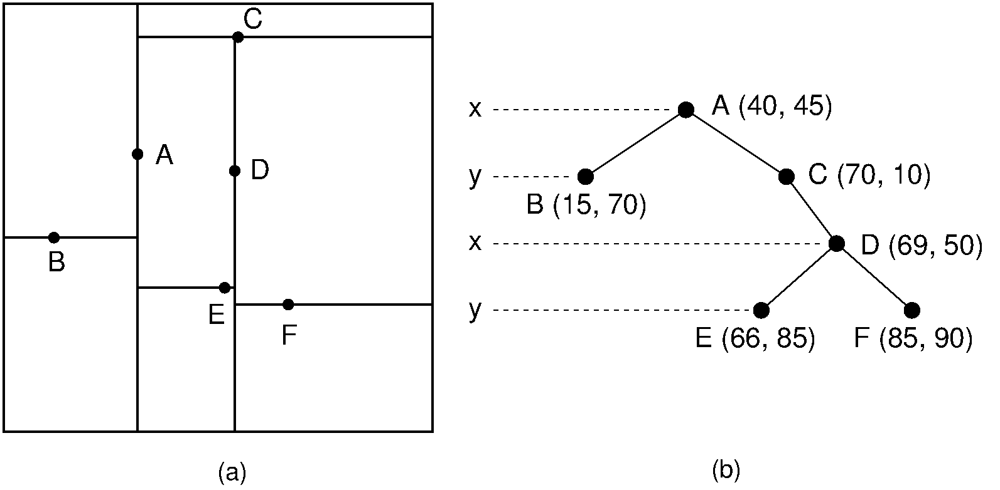



**Nearest Neighbor approach**

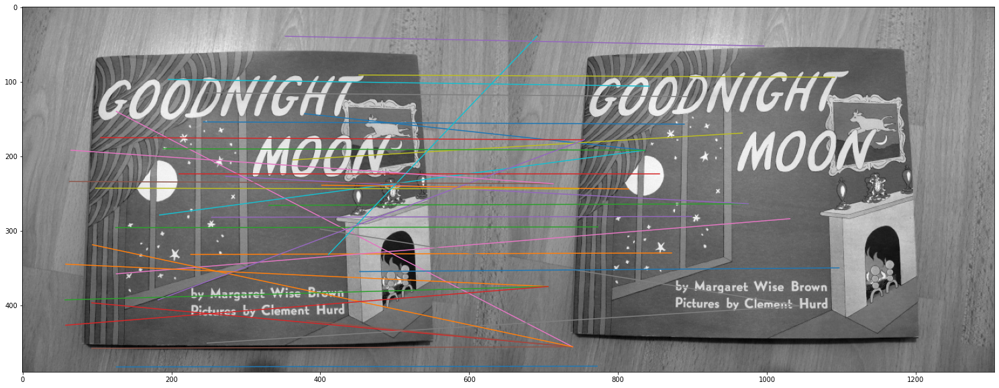

In [ ]:
from sklearn.neighbors import KDTree


def plot_matches(img1, img2, matches):
  h, w = img1.shape
  result = np.zeros((h, 2 * w))
  result[:, :w] = img1
  result[:, w:] = img2
  plt.imshow(result, cmap='gray')
  for y1, x1, y2, x2 in matches.T:
    xs = [x1, x2 + w]
    ys = [y1, y2]
    # plot on image only the points that are not on the border
    if filter_candidate_points([y1, x1], w, h) == True \
     and filter_candidate_points([y2, x2 + w],  2* w, h) == True:
      plt.plot(xs, ys)


# fit the features extracted to a KD-tree for faster matching
l1_kdt = KDTree(l1_data, leaf_size=5, metric='euclidean')
l2_kdt = KDTree(l2_data, leaf_size=5, metric='euclidean')

lines_nneigh = np.zeros((4, l1_data.shape[0]))

# for this matching, the nearest neighbor in the other set is 
# considered the match if the distance w.r.t the feature descriptor is the smallest one
for i in range(l1_data.shape[0]):
  dist, idx = l2_kdt.query(np.expand_dims(l1_data[i, :], axis=0), k=1)
  j = idx[0][0] #query interface limitation. Print the fn output to understand

  lines_nneigh[0, i] = filtered_l1_candidates.T[i, 1]
  lines_nneigh[1, i] = filtered_l1_candidates.T[i, 0]

  lines_nneigh[2, i] = filtered_l2_candidates.T[j, 1]
  lines_nneigh[3, i] = filtered_l2_candidates.T[j, 0]

plot_matches(l1_gray, l2_gray, lines_nneigh)

**Mutual Nearest neighbor approach**

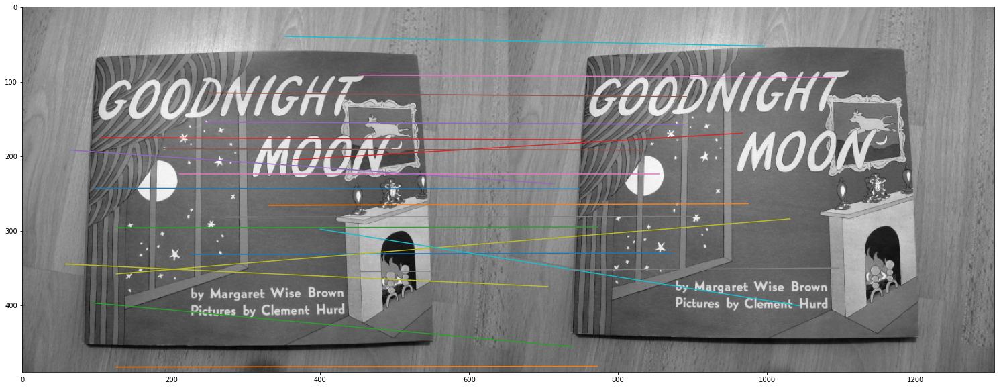

In [ ]:
lines_nneigh = np.zeros((4, l1_data.shape[0]))
# for this matching, two points x_i1, x_j2 are considered a match between 
# sets 1 and 2 if x_i1 is the nearest neighbor of x_j2 and x_j2 is the 
# nearest neighbor of x_i1
match_idx = 1
for i in range(l1_data.shape[0]):
  dist_1, idx_1 = l2_kdt.query(np.expand_dims(l1_data[i, :], axis=0), k=1)
  j = idx_1[0][0]
  dist_2, idx_2 = l1_kdt.query(np.expand_dims(l2_data[j, :], axis=0), k=1)
  same_i = idx_2[0][0]
  if i == same_i:
    lines_nneigh[0, match_idx] = filtered_l1_candidates.T[i, 1]
    lines_nneigh[1, match_idx] = filtered_l1_candidates.T[i, 0]

    lines_nneigh[2, match_idx] = filtered_l2_candidates.T[j, 1]
    lines_nneigh[3, match_idx] = filtered_l2_candidates.T[j, 0]
    match_idx += 1

lines_nneigh = lines_nneigh[:, :match_idx]
plot_matches(l1_gray, l2_gray, lines_nneigh)

**Ratio Tests**

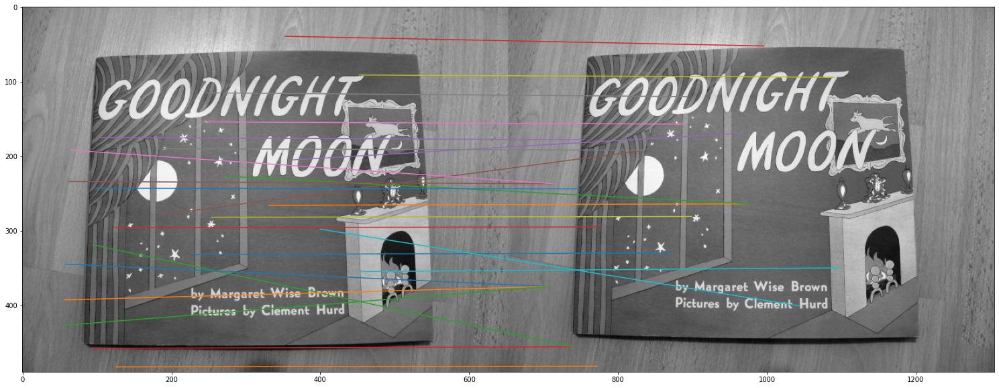

In [ ]:
r = 0.2

lines_nneigh = np.zeros((4, l1_data.shape[0]))
# for this matching, two points x_i1, x_j2 are considered a match between 
# sets 1 and 2 if x_j2 is the nearest neighbor of x_i1 and the second nearest
# neighbor  of x_i1 from set 2 is at a distance greater by a given ratio r in [0, 1)
match_idx = 1
for i in range(l1_data.shape[0]):
  dist, idx = l2_kdt.query(np.expand_dims(l1_data[i, :], axis=0), k=2)
  j = idx[0][0]
  if dist[0, 1]/dist[0, 0] > (1 + r):
    lines_nneigh[0, match_idx] = filtered_l1_candidates.T[i, 1]
    lines_nneigh[1, match_idx] = filtered_l1_candidates.T[i, 0]

    lines_nneigh[2, match_idx] = filtered_l2_candidates.T[j, 1]
    lines_nneigh[3, match_idx] = filtered_l2_candidates.T[j, 0]
    match_idx += 1

lines_nneigh = lines_nneigh[:, :match_idx]
plot_matches(l1_gray, l2_gray, lines_nneigh)

**PCA based feature descriptor**

In [ ]:
def pca_feature_extractor(img, point, k_pc=0):
  i, j = point.astype(np.int32)
  # extract a patch around the corner candidate
  data = np.expand_dims(img[(i-4):(i+5), (j-4):(j+5)].flatten(), axis=0)
  # center the data around the origin
  mean = data.mean()
  centered_data = data - mean
  # computhe the covariance matrix
  cov_matrix = 1/data.shape[0] * (centered_data.T @ centered_data)
  # perform an eigen decomposition of the covariance
  w, v = np.linalg.eig(cov_matrix)
  # sort the eigenvalues in descending order
  idx = np.abs(w).argsort()[::-1]   
  eigenvalues = w[idx]
  # align the eigenvectors to the sorted eigenvalues
  eigenvectors = np.abs(v)[:, idx]
  # stack the first k eigenvectors (corresponding to the largest eigenvalues)
  feature_descriptor = np.hstack([eigenvectors[:, i] for i in range(k_pc)])
  return feature_descriptor

In [ ]:
print(filtered_l1_candidates.shape)
print(filtered_l2_candidates.shape)
l1_data = np.array([pca_feature_extractor(l1_gray, x, k_pc=7) for x in filtered_l1_candidates.T])
l2_data = np.array([pca_feature_extractor(l2_gray, x, k_pc=7) for x in filtered_l2_candidates.T])
print(l1_data.shape, l2_data.shape)

(2, 47)
(2, 46)
(47, 567) (46, 567)


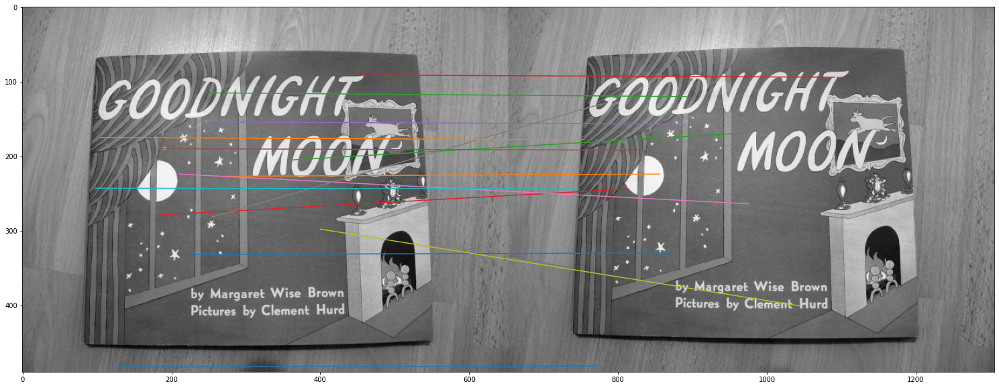

In [ ]:
l1_kdt = KDTree(l1_data, leaf_size=5, metric='euclidean')
l2_kdt = KDTree(l2_data, leaf_size=5, metric='euclidean')

lines_nneigh = np.zeros((4, l1_data.shape[0]))

match_idx = 1
for i in range(l1_data.shape[0]):
  dist_1, idx_1 = l2_kdt.query(np.expand_dims(l1_data[i, :], axis=0), k=1)
  j = idx_1[0][0]
  dist_2, idx_2 = l1_kdt.query(np.expand_dims(l2_data[j, :], axis=0), k=1)
  same_i = idx_2[0][0]
  if i == same_i:
    lines_nneigh[0, match_idx] = filtered_l1_candidates.T[i, 1]
    lines_nneigh[1, match_idx] = filtered_l1_candidates.T[i, 0]

    lines_nneigh[2, match_idx] = filtered_l2_candidates.T[j, 1]
    lines_nneigh[3, match_idx] = filtered_l2_candidates.T[j, 0]
    match_idx += 1

lines_nneigh = lines_nneigh[:, :match_idx]
plot_matches(l1_gray, l2_gray, lines_nneigh)